<a href="https://colab.research.google.com/github/annshita/IoT-Anomaly-Detection-PCA/blob/main/PCA_IIoT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [ ]:
data = pd.read_csv('ML-EdgeIIoT-dataset.csv')

<ipython-input-22-9b14bc8c8420>:1: DtypeWarning: Columns (3,6,11,13,14,15,16,17,31,32,34,39,45,51,54,55) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('ML-EdgeIIoT-dataset.csv')


In [ ]:
data.shape

(157800, 63)

In [ ]:
data['Attack_label'].value_counts()

,count
Attack_label,
1,133499
0,24301


In [ ]:
for column in data.columns:
    print(f"Column: {column}, Data Type: {data[column].dtype}")

Column: frame.time, Data Type: object
Column: ip.src_host, Data Type: object
Column: ip.dst_host, Data Type: object
Column: arp.dst.proto_ipv4, Data Type: object
Column: arp.opcode, Data Type: float64
Column: arp.hw.size, Data Type: float64
Column: arp.src.proto_ipv4, Data Type: object
Column: icmp.checksum, Data Type: float64
Column: icmp.seq_le, Data Type: float64
Column: icmp.transmit_timestamp, Data Type: float64
Column: icmp.unused, Data Type: float64
Column: http.file_data, Data Type: object
Column: http.content_length, Data Type: float64
Column: http.request.uri.query, Data Type: object
Column: http.request.method, Data Type: object
Column: http.referer, Data Type: object
Column: http.request.full_uri, Data Type: object
Column: http.request.version, Data Type: object
Column: http.response, Data Type: float64
Column: http.tls_port, Data Type: float64
Column: tcp.ack, Data Type: float64
Column: tcp.ack_raw, Data Type: float64
Column: tcp.checksum, Data Type: float64
Column: tcp.co

In [ ]:
object_columns = data.select_dtypes(include=['object']).columns
print("Columns with object datatype:", list(object_columns))

Columns with object datatype: ['frame.time', 'ip.src_host', 'ip.dst_host', 'arp.dst.proto_ipv4', 'arp.src.proto_ipv4', 'http.file_data', 'http.request.uri.query', 'http.request.method', 'http.referer', 'http.request.full_uri', 'http.request.version', 'tcp.options', 'tcp.payload', 'tcp.srcport', 'dns.qry.name.len', 'mqtt.conack.flags', 'mqtt.msg', 'mqtt.protoname', 'mqtt.topic', 'Attack_type']


In [ ]:
from sklearn.preprocessing import LabelEncoder
columns_to_encode = ['frame.time', 'ip.src_host', 'ip.dst_host', 'arp.dst.proto_ipv4', 'arp.src.proto_ipv4', 'http.file_data', 'http.request.uri.query', 'http.request.method', 'http.referer', 'http.request.full_uri', 'http.request.version', 'tcp.options', 'tcp.payload', 'tcp.srcport', 'dns.qry.name.len', 'mqtt.conack.flags', 'mqtt.msg', 'mqtt.protoname', 'mqtt.topic', 'Attack_type']
data[columns_to_encode] = data[columns_to_encode].astype(str)
le = LabelEncoder()
for col in columns_to_encode:
    data[col] = le.fit_transform(data[col])

In [ ]:
X = data.drop(columns=['Attack_label', 'Attack_type'])
y = data['Attack_label']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X_train_scaled)
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

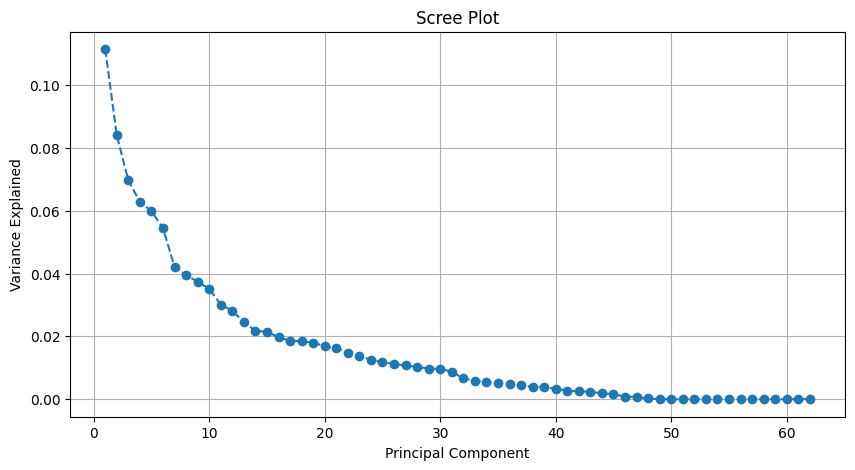

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Scree Plot')
plt.grid()
plt.show()

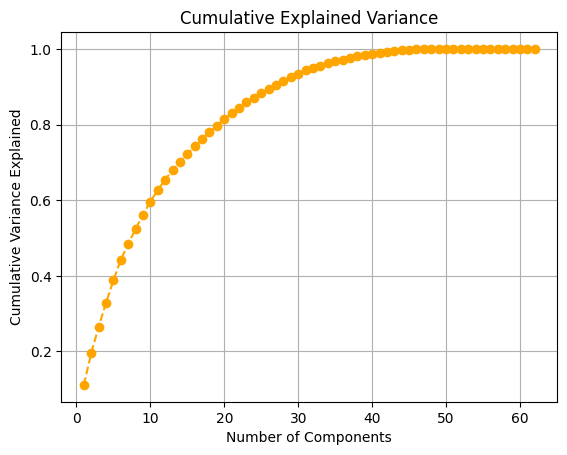

In [ ]:
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--', color='orange')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Explained Variance')
plt.grid()
plt.show()

In [ ]:
variance_threshold = 0.90
n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
print(f"Number of components to retain {variance_threshold*100}% variance: {n_components}")

Number of components to retain 90.0% variance: 27


In [ ]:
pca = PCA(n_components=27)
X_reduced_train = pca.fit_transform(X_train_scaled)
print(f"Shape of reduced data: {X_reduced_train.shape}")

Shape of reduced data: (126240, 27)


In [ ]:
pca = PCA(n_components=27)
X_reduced_test = pca.fit_transform(X_test_scaled)
print(f"Shape of reduced data: {X_reduced_test.shape}")

Shape of reduced data: (31560, 27)


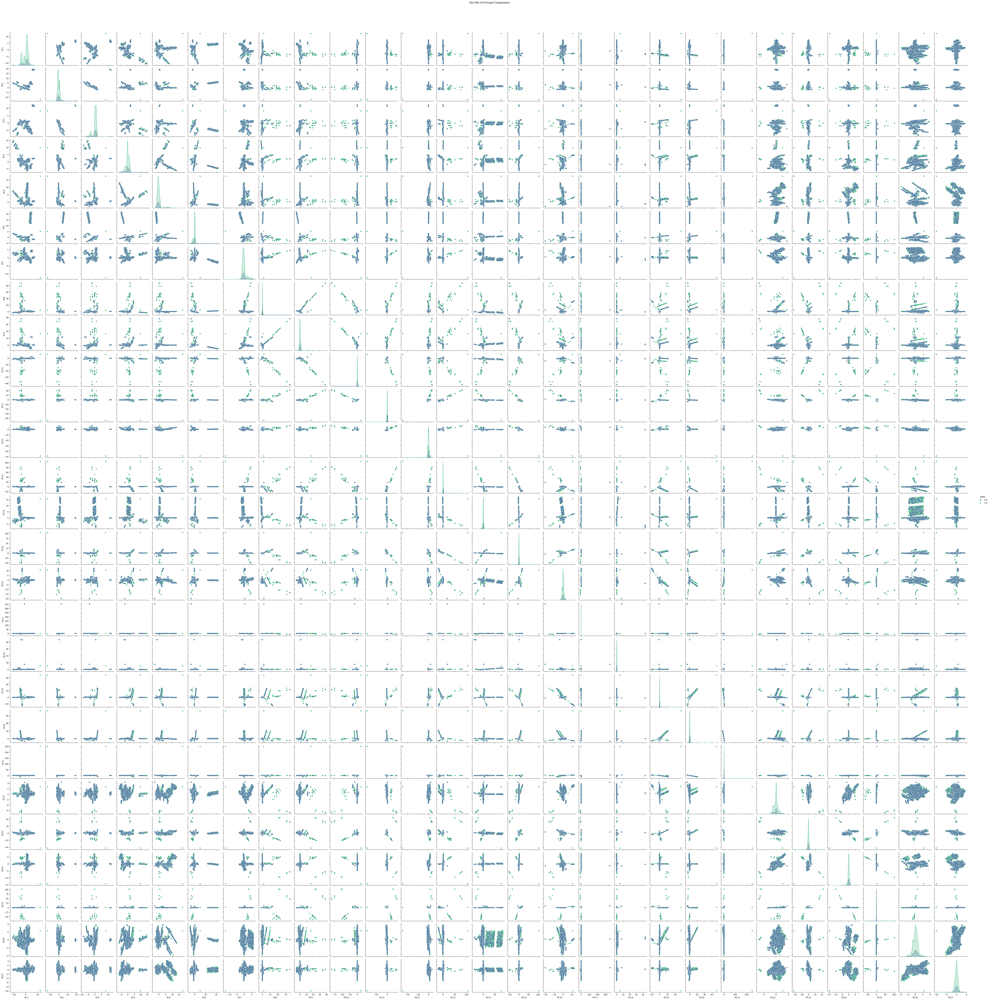

In [ ]:
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
pca_df = pd.DataFrame(X_reduced_train, columns=[f'PC{i+1}' for i in range(X_reduced_train.shape[1])])
pca_df['label'] = y_train
sns.pairplot(pca_df, hue='label', palette='viridis', diag_kind='kde')
plt.suptitle('Pair Plot of Principal Components', y=1.02)
plt.show()

In [ ]:
import numpy as np
from sklearn.svm import OneClassSVM
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
ocsvm = OneClassSVM(kernel='rbf', gamma='auto', nu=0.1)
ocsvm.fit(X_reduced_train)
y_pred = ocsvm.predict(X_reduced_test)

In [ ]:
precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
f1 = f1_score(y_test, y_pred, average='weighted')
accuracy = accuracy_score(y_test, y_pred)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"Accuracy: {accuracy:.2f}")

Precision: 0.75
Recall: 0.55
F1 Score: 0.63
Accuracy: 0.55


Mean Squared Error: 1.3222
AUC-ROC Score: 0.6013


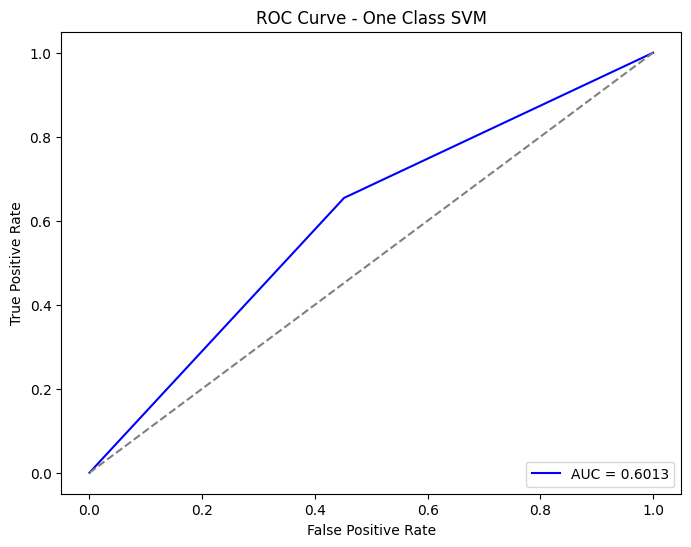

In [ ]:
from sklearn.metrics import mean_squared_error, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
auc_score = roc_auc_score(y_test, y_pred)
print(f"AUC-ROC Score: {auc_score:.4f}")
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f"AUC = {auc_score:.4f}")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - One Class SVM")
plt.legend(loc="lower right")
plt.show()

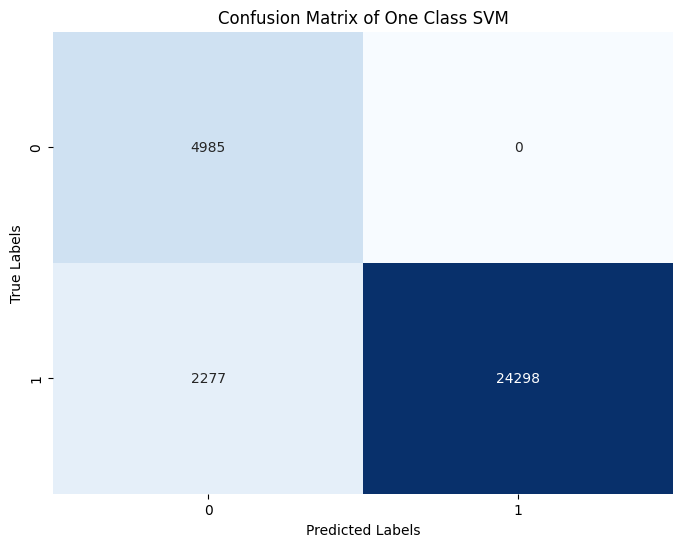

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred, labels=[0,1])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of One Class SVM")
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(min_samples_split=10, min_samples_leaf=5, random_state=42)
dt_model.fit(X_reduced_train, y_train)
y_pred = dt_model.predict(X_reduced_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
print("Decision Tree Performance:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

Decision Tree Performance:
Accuracy: 0.93
Precision: 0.95
Recall: 0.93
F1 Score: 0.93


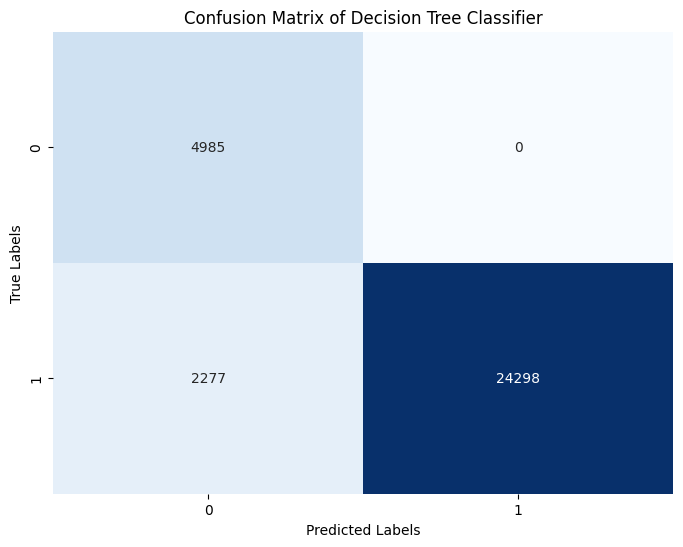

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of Decision Tree Classifier")
plt.show()


Mean Squared Error: 0.0721
AUC-ROC Score: 0.9572


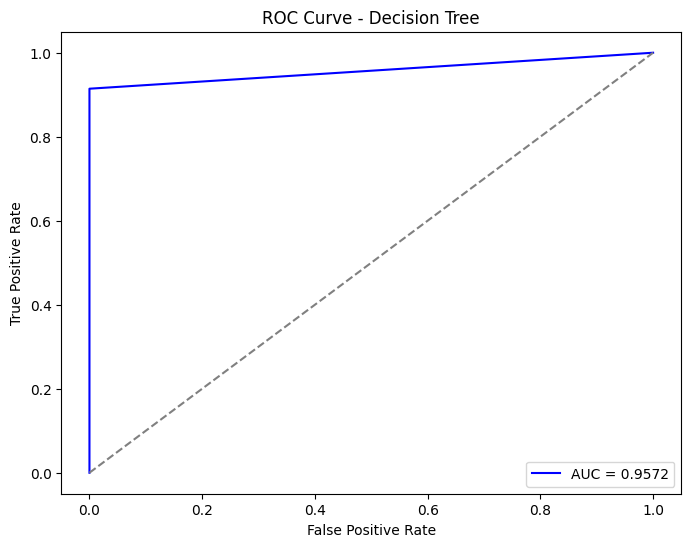

In [ ]:
from sklearn.metrics import mean_squared_error, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
auc_score = roc_auc_score(y_test, y_pred)
print(f"AUC-ROC Score: {auc_score:.4f}")
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f"AUC = {auc_score:.4f}")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree")
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=3,algorithm='kd_tree')
model.fit(X_reduced_train, y_train)

KNeighborsClassifier(algorithm='kd_tree', n_neighbors=3)

In [ ]:
y_pred_knn = model.predict(X_reduced_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred_knn)
precision = precision_score(y_test, y_pred_knn, average='weighted')
recall = recall_score(y_test, y_pred_knn, average='weighted')
f1 = f1_score(y_test, y_pred_knn, average='weighted')
print("KNN:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

KNN:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00


Mean Squared Error: 0.0030
AUC-ROC Score: 0.9976


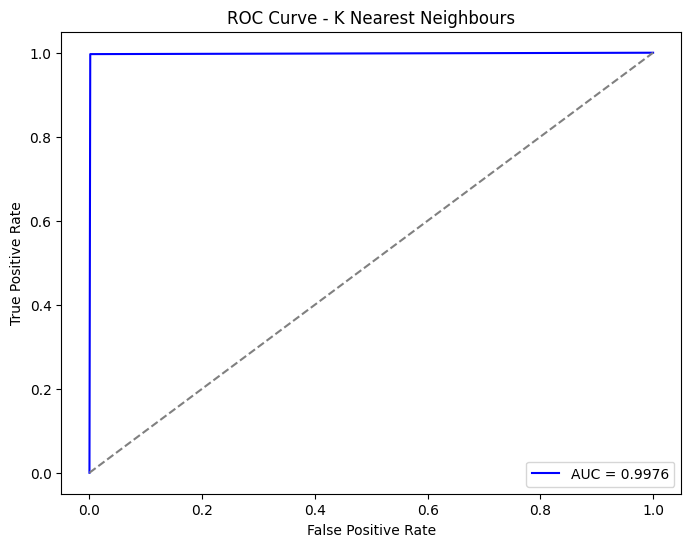

In [ ]:
from sklearn.metrics import mean_squared_error, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
mse = mean_squared_error(y_test, y_pred_knn)
print(f"Mean Squared Error: {mse:.4f}")
auc_score = roc_auc_score(y_test, y_pred_knn)
print(f"AUC-ROC Score: {auc_score:.4f}")
fpr, tpr, thresholds = roc_curve(y_test, y_pred_knn)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f"AUC = {auc_score:.4f}")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - K Nearest Neighbours")
plt.legend(loc="lower right")
plt.show()

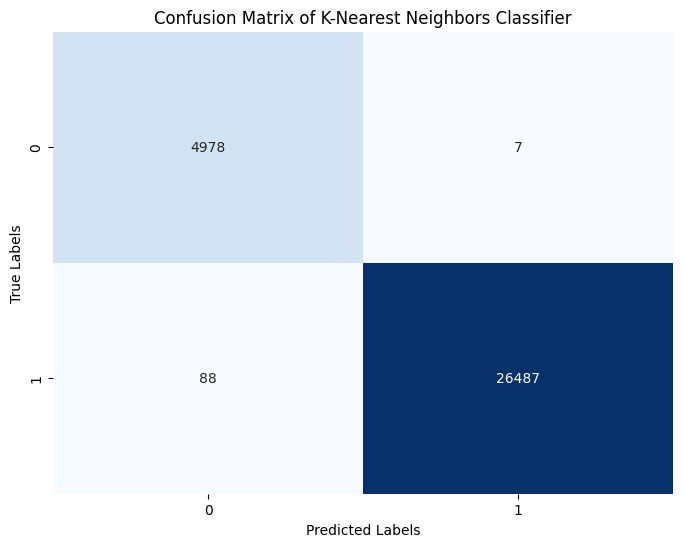

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of K-Nearest Neighbors Classifier")
plt.show()

In [ ]:
from sklearn.ensemble import IsolationForest
model = IsolationForest()
model.fit(X_reduced_train)

IsolationForest()

In [ ]:
y_pred_isofor=model.predict(X_reduced_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred_isofor)
precision = precision_score(y_test, y_pred_isofor, average='weighted',zero_division=0)
recall = recall_score(y_test, y_pred_isofor, average='weighted',zero_division=0)
f1 = f1_score(y_test, y_pred_isofor, average='weighted')
print("Isolation Forest:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

Isolation Forest:
Accuracy: 0.79
Precision: 0.73
Recall: 0.79
F1 Score: 0.76


Mean Squared Error: 0.3606
AUC-ROC Score: 0.5847


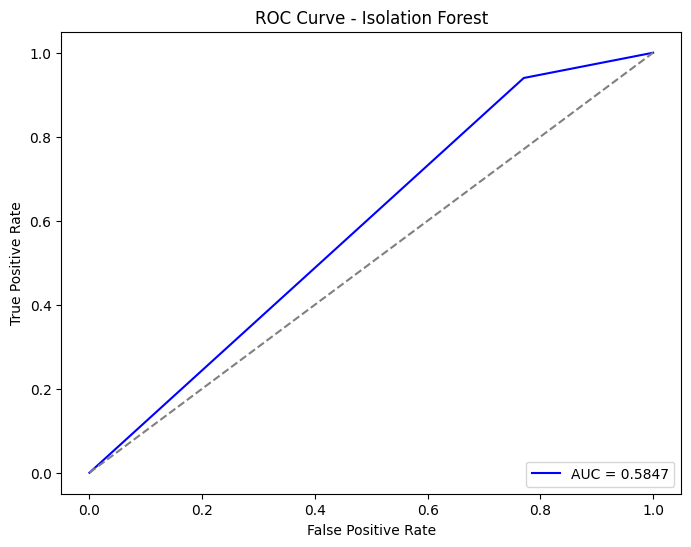

In [ ]:
from sklearn.metrics import mean_squared_error, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
mse = mean_squared_error(y_test, y_pred_isofor)
print(f"Mean Squared Error: {mse:.4f}")
auc_score = roc_auc_score(y_test, y_pred_isofor)
print(f"AUC-ROC Score: {auc_score:.4f}")
fpr, tpr, thresholds = roc_curve(y_test, y_pred_isofor)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f"AUC = {auc_score:.4f}")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Isolation Forest")
plt.legend(loc="lower right")
plt.show()

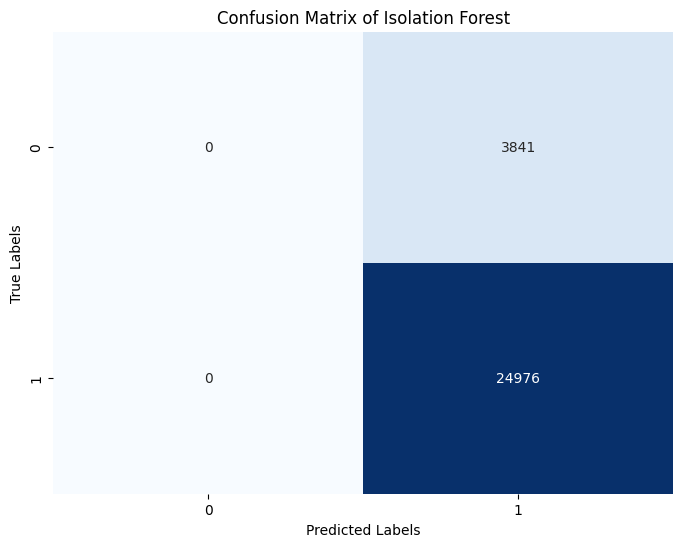

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_isofor, labels=[0,1])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of Isolation Forest")
plt.show()

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
import numpy as np
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
y_pred_lof = lof.fit_predict(X_reduced_test)

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, classification_report
precision = precision_score(y_test, y_pred_lof, average='weighted',zero_division=0)
recall = recall_score(y_test, y_pred_lof, average='weighted',zero_division=0)
f1 = f1_score(y_test, y_pred_lof, average='weighted',zero_division=0)
accuracy = accuracy_score(y_test, y_pred_lof)

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Accuracy:", accuracy)
print("\nClassification Report:\n", classification_report(y_test, y_pred_lof))

Precision: 0.7060636140521097
Recall: 0.754657794676806
F1 Score: 0.7295524070476408
Accuracy: 0.754657794676806

Classification Report:
               precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      4985
           1       0.84      0.90      0.87     26575

    accuracy                           0.75     31560
   macro avg       0.28      0.30      0.29     31560
weighted avg       0.71      0.75      0.73     31560



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

Mean Squared Error: 0.5075
AUC-ROC Score: 0.4880


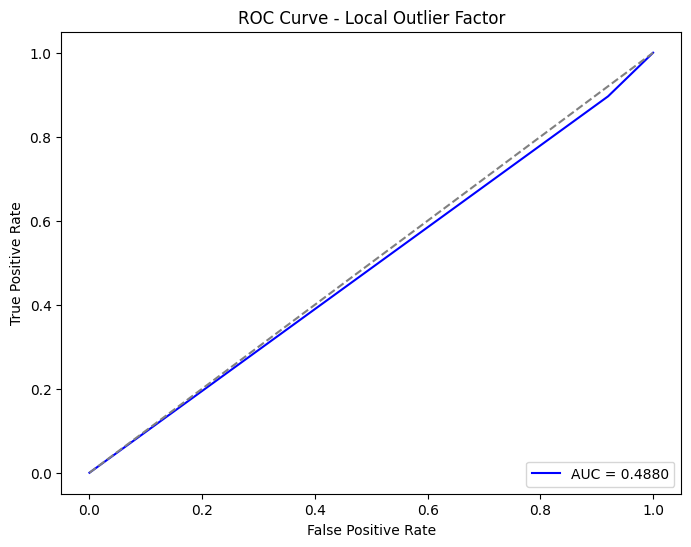

In [ ]:
from sklearn.metrics import mean_squared_error, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
mse = mean_squared_error(y_test, y_pred_lof)
print(f"Mean Squared Error: {mse:.4f}")
auc_score = roc_auc_score(y_test, y_pred_lof)
print(f"AUC-ROC Score: {auc_score:.4f}")
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lof)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f"AUC = {auc_score:.4f}")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Local Outlier Factor")
plt.legend(loc="lower right")
plt.show()

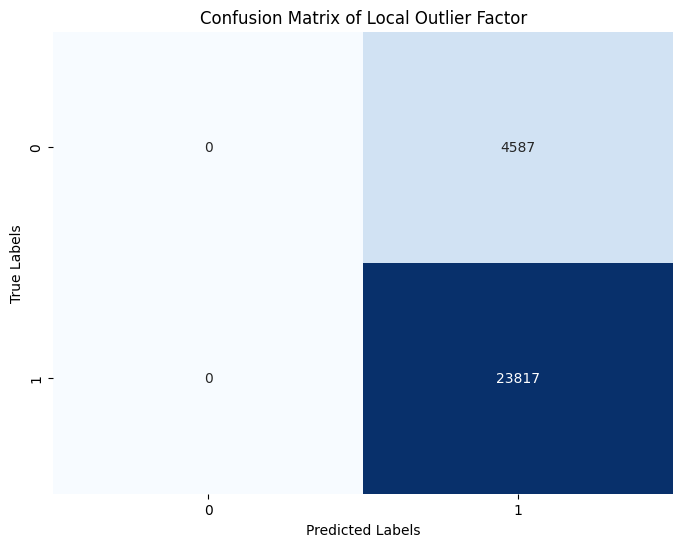

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_lof, labels=[0,1])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix of Local Outlier Factor")
plt.show()